# Final Project Submission

Please fill out:
* Student name: Nat Berryman
* Student pace: full time
* Scheduled project review date/time: 
* Instructor name: Hardik Idnani
* Blog post URL:


In [1]:
# importing the packages we will be using for this project
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib import rcParams
import seaborn as sns
import seaborn as sb
sb.set()
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import OneHotEncoder, StandardScaler
import folium
import haversine as hs
from geopy.distance import geodesic
import geopy.distance

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

import sklearn
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from statsmodels.formula.api import ols
import sklearn.metrics as metrics

from scipy import stats 
import math

import pylab

%matplotlib inline

First steps are exploring the data.
1. Assessing data info and types
2. Dropping uneccessary data
3. Identifying null values and outliers and removing them

In [2]:
df_kc = pd.read_csv('data/kc_house_data.csv')
df_kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [4]:
df_kc = df_kc.drop(['id', 'date', 'yr_renovated'], axis=1)
df_kc.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,98178,47.5112,-122.257,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,98125,47.7210,-122.319,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,98028,47.7379,-122.233,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,98136,47.5208,-122.393,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,98074,47.6168,-122.045,1800,7503


In [5]:
df_kc.isnull().sum()

price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [6]:
df_kc['waterfront'].fillna(0.0, inplace=True)
df_kc['view'].fillna(0.0, inplace=True)

In [7]:
df_kc['bedrooms'].value_counts()

3     9824
4     6882
2     2760
5     1601
6      272
1      196
7       38
8       13
9        6
10       3
11       1
33       1
Name: bedrooms, dtype: int64

Appears an outlier in the the bedroom fields with 33 bedrooms.
After assessing all bedrooms it was decided to model on typical family homes under 6 bedrooms.

In [8]:
df_kc = df_kc[df_kc.bedrooms < 6]

Following the imperial rule I removed the outliers.

In [9]:
std = df_kc.price.std()
print('std: ',std)
mean = df_kc.price.mean()
print('mean: ', mean)
std_2 = mean + 2*std
std_2m = mean - 2*std
print('mean +2 std: ',std_2)
print('mean -2 std: ',std_2m)

std:  354779.9144259948
mean:  535420.5864177209
mean +2 std:  1244980.4152697106
mean -2 std:  -174139.2424342687


In [10]:
df_kc = df_kc.loc[(df_kc['price']<std_2) & (df_kc['price']>std_2m)]
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20407 non-null  float64
 1   bedrooms       20407 non-null  int64  
 2   bathrooms      20407 non-null  float64
 3   sqft_living    20407 non-null  int64  
 4   sqft_lot       20407 non-null  int64  
 5   floors         20407 non-null  float64
 6   waterfront     20407 non-null  float64
 7   view           20407 non-null  float64
 8   condition      20407 non-null  int64  
 9   grade          20407 non-null  int64  
 10  sqft_above     20407 non-null  int64  
 11  sqft_basement  20407 non-null  object 
 12  yr_built       20407 non-null  int64  
 13  zipcode        20407 non-null  int64  
 14  lat            20407 non-null  float64
 15  long           20407 non-null  float64
 16  sqft_living15  20407 non-null  int64  
 17  sqft_lot15     20407 non-null  int64  
dtypes: flo

Zipcode Dtype changed to a string.

In [11]:
df_kc['zipcode'] = df_kc['zipcode'].astype('str')

In [12]:
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20407 non-null  float64
 1   bedrooms       20407 non-null  int64  
 2   bathrooms      20407 non-null  float64
 3   sqft_living    20407 non-null  int64  
 4   sqft_lot       20407 non-null  int64  
 5   floors         20407 non-null  float64
 6   waterfront     20407 non-null  float64
 7   view           20407 non-null  float64
 8   condition      20407 non-null  int64  
 9   grade          20407 non-null  int64  
 10  sqft_above     20407 non-null  int64  
 11  sqft_basement  20407 non-null  object 
 12  yr_built       20407 non-null  int64  
 13  zipcode        20407 non-null  object 
 14  lat            20407 non-null  float64
 15  long           20407 non-null  float64
 16  sqft_living15  20407 non-null  int64  
 17  sqft_lot15     20407 non-null  int64  
dtypes: flo

Idenfitied values with high correlation.

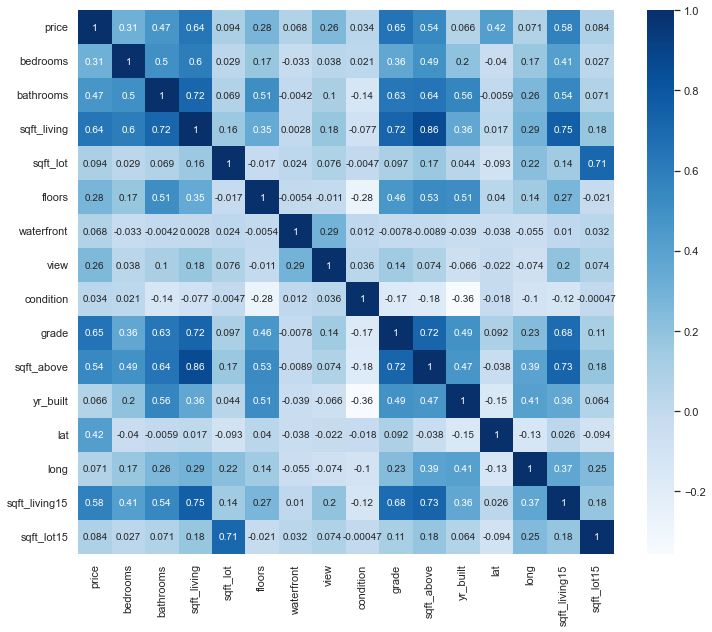

In [13]:
corr = df_kc.corr()
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, cmap="Blues", annot=True);

Changed the view to a boolean table to easily identify any multicolinearity.

In [14]:
abs(corr) > .5

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,lat,long,sqft_living15,sqft_lot15
price,True,False,False,True,False,False,False,False,False,True,True,False,False,False,True,False
bedrooms,False,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,True,True,True,False,True,False,False,False,True,True,True,False,False,True,False
sqft_living,True,True,True,True,False,False,False,False,False,True,True,False,False,False,True,False
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True
floors,False,False,True,False,False,True,False,False,False,False,True,True,False,False,False,False
waterfront,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False
grade,True,False,True,True,False,False,False,False,False,True,True,False,False,False,True,False


Created a new df to group Zipcodes together as it may come in handy later in the project.

In [15]:
df_zipcode = df_kc.groupby('zipcode').aggregate(np.mean)
df_zipcode.reset_index(inplace=True)
df_zipcode.sort_values(by='price',ascending = False)
df_zipcode = df_zipcode[['zipcode', 'price']]
df_zipcode.describe()

,price
count,70.000000
mean,497182.320230
std,174681.726158
min,230788.078534
25%,346743.434478
50%,476364.077923
75%,603052.148462
max,999444.444444


In [16]:
df_zipcode.sort_values('price', ascending=False, inplace=True)
df_zipcode

,zipcode,price
24,98039,999444.444444
25,98040,878885.284916
3,98004,869515.414201
48,98112,776485.288043
4,98005,755906.333333
...,...,...
13,98023,284503.554435
0,98001,281337.077778
20,98032,250179.105691
64,98168,240328.371747


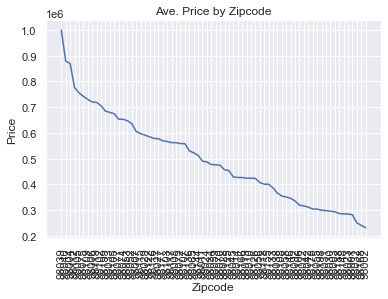

In [17]:
x = df_zipcode['zipcode']
y = df_zipcode['price']
  
plt.plot(x, y)
  
plt.xlabel('Zipcode')
plt.ylabel('Price')
  
plt.title('Ave. Price by Zipcode')
plt.xticks(rotation = 90)
sns.set(rc = {'figure.figsize':(25,20)})  

plt.show()

In [18]:
# create a df for number of houses based on zipcode
df_kc['count'] = 1 
count_zip = df_kc.groupby('zipcode').sum()

count_zip.reset_index(inplace = True) 
count_zip = count_zip[['zipcode', 'count']] #eliminating everything but count and zip
df_zipcode = pd.merge(df_zipcode, count_zip, on='zipcode') #joining df_zipcode and count_zip on shared column (zipcode)

df_kc.drop(['count'], axis = 1, inplace = True)# removing the count column from original dataset

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


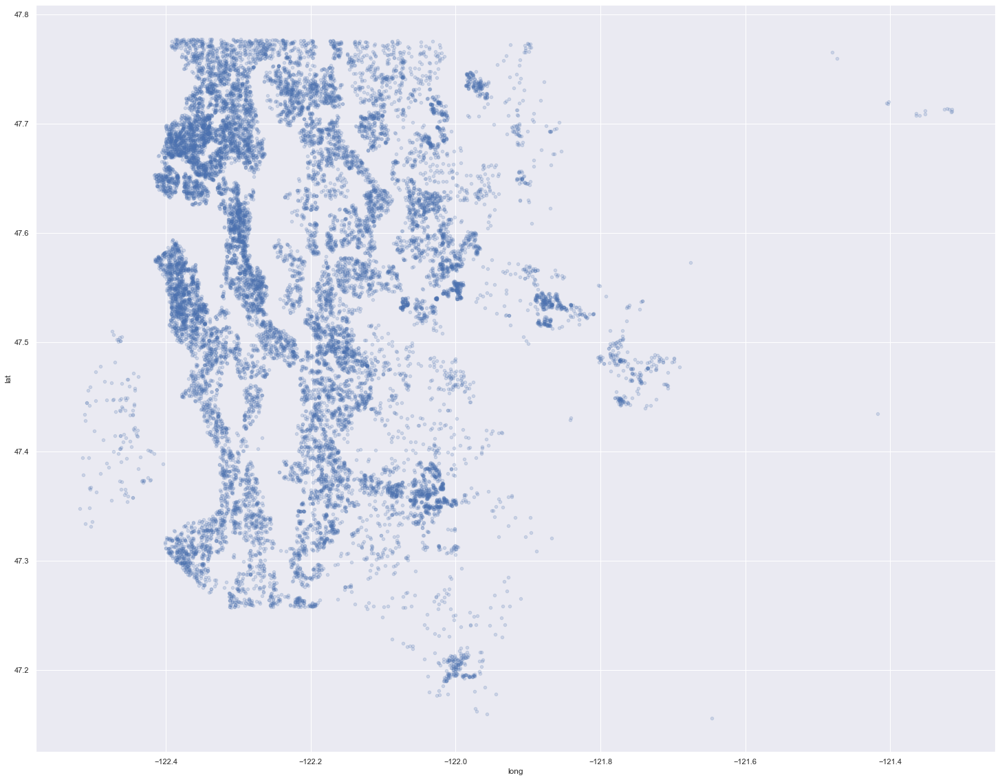

In [19]:
df_kc.plot(kind="scatter", x="long", y="lat", alpha=0.2)
sns.set(rc = {'figure.figsize':(10,7)}) 

<AxesSubplot:xlabel='long', ylabel='lat'>

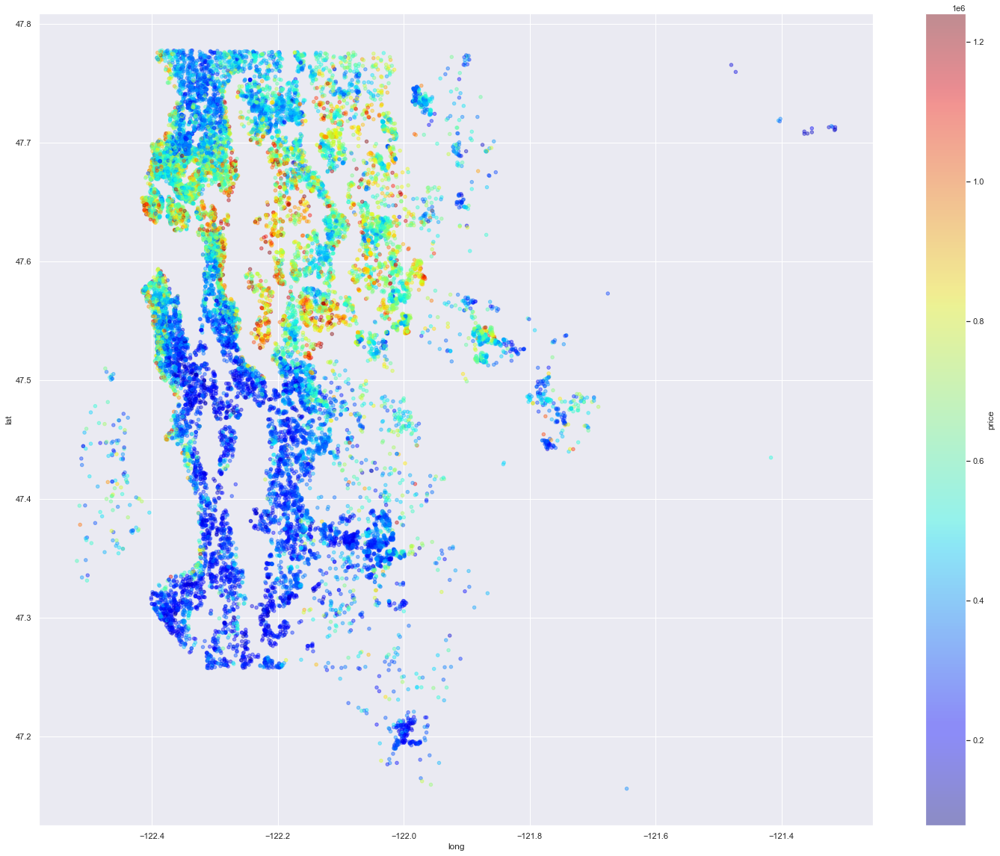

In [20]:
df_kc.plot(kind="scatter", x="long", y="lat", alpha=0.4, figsize=(25,20),
    c="price", cmap=plt.get_cmap("jet"), colorbar=True,
    sharex=False)

In [21]:
import json #importing json
f = open('data/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson') # opening the file
zip_geo = json.load(f) #loading the file

In [22]:
type(zip_geo) #what is the root data type?

dict

In [23]:
zip_geo.keys() #let's check the keys

dict_keys(['type', 'name', 'crs', 'features'])

In [24]:
zip_geo['type'] #invetsigating keys further

'FeatureCollection'

In [25]:
zip_geo['features'][0] #taking a look at the first entry in "features"

{'type': 'Feature',
 'properties': {'Name': None,
  'description': None,
  'OBJECTID': 1,
  'ZIP': 98001,
  'ZIPCODE': '98001',
  'COUNTY': '033',
  'ZIP_TYPE': 'Standard',
  'Shape_Length': 148134.770976135,
  'Shape_Area': 526121353.970491,
  'COUNTY_NAME': 'King County',
  'PREFERRED_CITY': 'AUBURN'},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-122.290611739527, 47.3553926354311],
    [-122.290611557838, 47.355415072566],
    [-122.29061129257, 47.3554417498619],
    [-122.290610079942, 47.3555774792625],
    [-122.290606350762, 47.3559941339248],
    [-122.290606055732, 47.3560274170098],
    [-122.290603589477, 47.3563033430165],
    [-122.290601189866, 47.3565734085795],
    [-122.290598753785, 47.3568465099761],
    [-122.290597812245, 47.3569534561804],
    [-122.290596331583, 47.3571201102364],
    [-122.290596758404, 47.3573902436317],
    [-122.290596979493, 47.357531087563],
    [-122.290597154526, 47.3576439283475],
    [-122.290597181333, 47.3576602372406],
    

In [26]:
temp = zip_geo
finalzips = [] #creating a list to store our final zips
for i in range(len(temp['features'])):
    if temp['features'][i]['properties']['ZIPCODE'] in list(df_zipcode['zipcode'].unique()): #only zips included in both datasets!
        finalzips.append(temp['features'][i])
        

clean_json = dict.fromkeys(['type','features']) # making a separate json 
clean_json['type'] = 'FeatureCollection'
clean_json['features'] = finalzips

# save our new, cleaned json
open("final_geodata.json", "w").write(json.dumps(clean_json, sort_keys=True, indent=4, separators=(',', ': ')))

12192211

In [27]:
import folium

# read cleaned geo data
king_geo = "final_geodata.json"

# Create Folium Map using the means of our lat and long variables 
m = folium.Map(location=[df_kc['lat'].mean(), df_kc['long'].mean()], zoom_start=9,
                   detect_retina=True, control_scale=False)

# Create choropleth map
folium.Choropleth(
    geo_data=king_geo,
    data=df_zipcode,
    columns=['zipcode', 'price'],
    key_on='feature.properties.ZIPCODE',
    fill_color='OrRd',
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name='zipcode + price'
    ).add_to(m)

folium.LayerControl().add_to(m)

m.save('zipcode_price.html') #save map as html file

m   #show map 

In [28]:
folium.Choropleth(
    geo_data=king_geo,
    data=df_zipcode,
    columns=['zipcode', 'count'],
    key_on='feature.properties.ZIPCODE',
    fill_color='OrRd',
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name='zipcode + count'
    ).add_to(m)

folium.LayerControl().add_to(m)

m.save('zipcode_count.html') #save map as html file

m   #show map 

In [29]:
df_kc['cbd_lat'] = 47.28
df_kc['cbd_long'] = -121.50
df_kc.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,cbd_lat,cbd_long
0,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,98178,47.5112,-122.257,1340,5650,47.28,-121.5
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,98125,47.7210,-122.319,1690,7639,47.28,-121.5
2,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,98028,47.7379,-122.233,2720,8062,47.28,-121.5
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,98136,47.5208,-122.393,1360,5000,47.28,-121.5
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,98074,47.6168,-122.045,1800,7503,47.28,-121.5


In [30]:
def distance(row): 
    housecoord = (row['lat'], row['long']) 
    cbdcoord = (row['cbd_lat'], row['cbd_long']) 
    return (geodesic(housecoord, cbdcoord).km)

In [31]:
df_kc['km_from_cbd'] = df_kc.apply(lambda row: distance(row), axis = 1)
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          20407 non-null  float64
 1   bedrooms       20407 non-null  int64  
 2   bathrooms      20407 non-null  float64
 3   sqft_living    20407 non-null  int64  
 4   sqft_lot       20407 non-null  int64  
 5   floors         20407 non-null  float64
 6   waterfront     20407 non-null  float64
 7   view           20407 non-null  float64
 8   condition      20407 non-null  int64  
 9   grade          20407 non-null  int64  
 10  sqft_above     20407 non-null  int64  
 11  sqft_basement  20407 non-null  object 
 12  yr_built       20407 non-null  int64  
 13  zipcode        20407 non-null  object 
 14  lat            20407 non-null  float64
 15  long           20407 non-null  float64
 16  sqft_living15  20407 non-null  int64  
 17  sqft_lot15     20407 non-null  int64  
 18  cbd_la

Seperated df into continous and categorical data values and removed any unnessessary data.

In [32]:
df_cont = df_kc[['price', 'bedrooms','bathrooms','sqft_living','sqft_lot','floors','sqft_above','sqft_living15','sqft_lot15','km_from_cbd']].copy()
df_cat = df_kc[['waterfront','view','condition','grade','yr_built','zipcode']].copy()

In [33]:
df_cat['rating'] = pd.cut(df_cat.grade,
                         bins = [0,5,9,13], labels = ("low_grade", "average_grade", "high_grade"))

In [34]:
df_cat['rating']

0        average_grade
1        average_grade
2        average_grade
3        average_grade
4        average_grade
             ...      
21592    average_grade
21593    average_grade
21594    average_grade
21595    average_grade
21596    average_grade
Name: rating, Length: 20407, dtype: category
Categories (3, object): ['low_grade' < 'average_grade' < 'high_grade']

In [35]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   waterfront  20407 non-null  float64 
 1   view        20407 non-null  float64 
 2   condition   20407 non-null  int64   
 3   grade       20407 non-null  int64   
 4   yr_built    20407 non-null  int64   
 5   zipcode     20407 non-null  object  
 6   rating      20407 non-null  category
dtypes: category(1), float64(2), int64(3), object(1)
memory usage: 1.1+ MB


In [36]:
df_cat['waterfront'] = df_cat['waterfront'].astype('int')
df_cat['condition'] = df_cat['condition'].astype('int')

df_cat['waterfront'] = df_cat['waterfront'].astype('str')
df_cat['condition'] = df_cat['condition'].astype('str')
df_cat['grade'] = df_cat['grade'].astype('str')
df_cat['zipcode'] = df_cat['zipcode'].astype('str')

df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   waterfront  20407 non-null  object  
 1   view        20407 non-null  float64 
 2   condition   20407 non-null  object  
 3   grade       20407 non-null  object  
 4   yr_built    20407 non-null  int64   
 5   zipcode     20407 non-null  object  
 6   rating      20407 non-null  category
dtypes: category(1), float64(1), int64(1), object(4)
memory usage: 1.1+ MB


In [37]:
df_cat = df_cat.drop(columns = ['yr_built','view','grade'])

I then created dummy data for the categorical data.

In [38]:
df_cat = pd.get_dummies(df_cat)
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 80 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   waterfront_0          20407 non-null  uint8
 1   waterfront_1          20407 non-null  uint8
 2   condition_1           20407 non-null  uint8
 3   condition_2           20407 non-null  uint8
 4   condition_3           20407 non-null  uint8
 5   condition_4           20407 non-null  uint8
 6   condition_5           20407 non-null  uint8
 7   zipcode_98001         20407 non-null  uint8
 8   zipcode_98002         20407 non-null  uint8
 9   zipcode_98003         20407 non-null  uint8
 10  zipcode_98004         20407 non-null  uint8
 11  zipcode_98005         20407 non-null  uint8
 12  zipcode_98006         20407 non-null  uint8
 13  zipcode_98007         20407 non-null  uint8
 14  zipcode_98008         20407 non-null  uint8
 15  zipcode_98010         20407 non-null  uint8
 16  zipc

Next steps where normalising the continous data to assist with the modeling.

In [39]:
log_names = [f'{column}_log' for column in df_cont.columns]

df_log = np.log(df_cont)
df_log.columns = log_names

def normalize(feature):
    return (feature - feature.mean()) / feature.std()

df_log_norm = df_log.apply(normalize)

df_log_norm.head()

,price_log,bedrooms_log,bathrooms_log,sqft_living_log,sqft_lot_log,floors_log,sqft_above_log,sqft_living15_log,sqft_lot15_log,km_from_cbd_log
0,-1.487131,-0.222180,-1.709840,-1.102922,-0.362773,-0.934264,-0.711532,-1.011689,-0.372781,0.018521
1,0.456783,-0.222180,0.420363,0.849875,-0.086171,1.040181,0.787637,-0.270461,-0.000077,1.117658
2,-1.946467,-1.715423,-1.709840,-2.173860,0.273383,-0.934264,-1.762009,1.249640,0.066522,0.886634
3,0.710772,0.837293,1.176064,0.170098,-0.498954,-0.934264,-0.998771,-0.964367,-0.523806,0.719466
4,0.339467,-0.222180,0.110963,-0.216629,0.035833,-0.934264,0.157828,-0.069044,-0.022275,-0.554496


In [40]:
df_log_norm.describe()

,price_log,bedrooms_log,bathrooms_log,sqft_living_log,sqft_lot_log,floors_log,sqft_above_log,sqft_living15_log,sqft_lot15_log,km_from_cbd_log
count,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04,2.040700e+04
mean,9.016883e-14,2.662250e-13,-2.135914e-13,2.101624e-13,-1.738946e-14,-8.767890e-14,2.526464e-13,2.681757e-13,-7.375243e-14,-1.712251e-14
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-3.781986e+00,-4.268139e+00,-3.530643e+00,-4.012499e+00,-3.020900e+00,-9.342642e-01,-3.565521e+00,-4.881269e+00,-3.043028e+00,-6.045787e+00
25%,-7.181408e-01,-2.221801e-01,-6.447386e-01,-6.740302e-01,-4.989540e-01,-9.342642e-01,-7.324757e-01,-7.159345e-01,-5.090659e-01,-5.948828e-01
50%,1.291885e-02,-2.221801e-01,1.109628e-01,2.519488e-02,-4.716580e-02,-9.342642e-01,-8.846023e-02,-5.134817e-02,-1.292249e-02,1.852222e-01
75%,7.216471e-01,8.372927e-01,6.971304e-01,7.196508e-01,3.117147e-01,1.040181e+00,7.186369e-01,6.999926e-01,3.215510e-01,7.880507e-01
max,2.289580e+00,1.659084e+00,2.996867e+00,3.486066e+00,5.963583e+00,2.634259e+00,3.779719e+00,3.662812e+00,5.852993e+00,1.581854e+00


I then ran some graphs to get a view of what the data looks like.

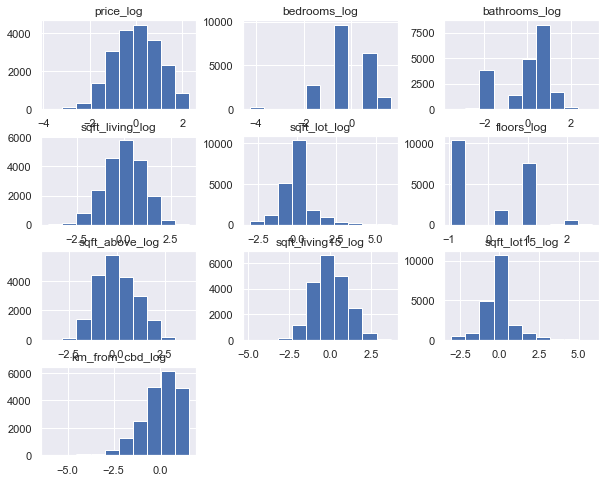

In [41]:
df_log_norm.hist(figsize=(10,8));

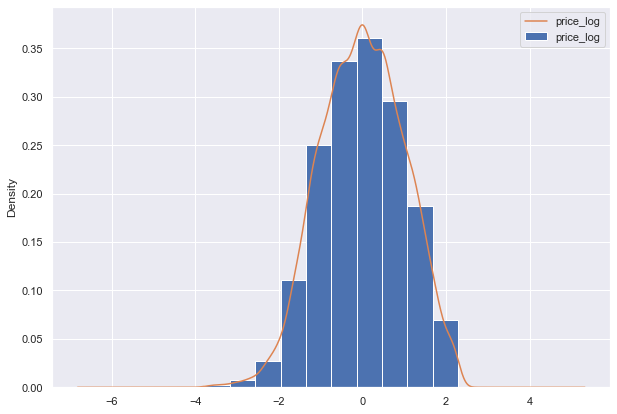

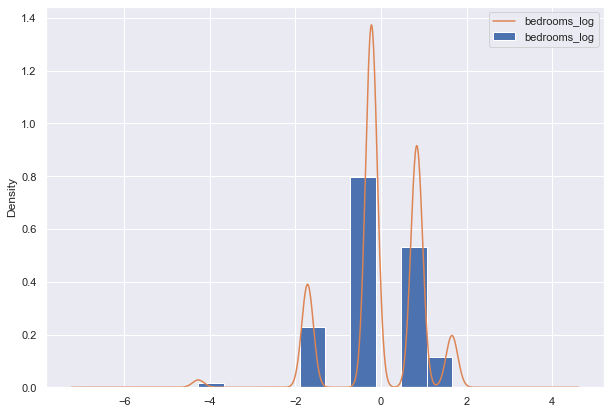

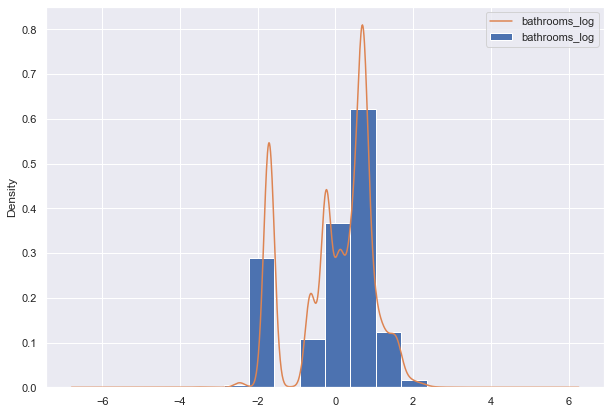

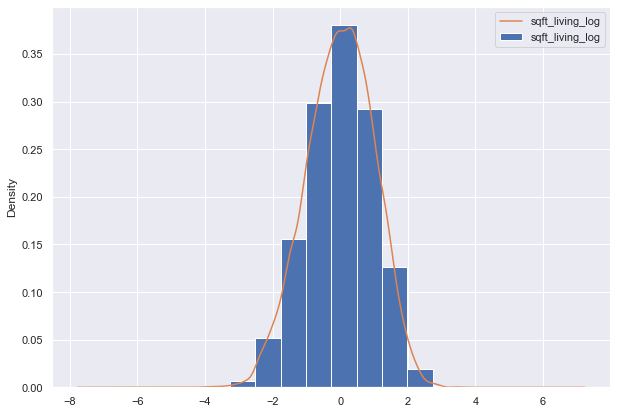

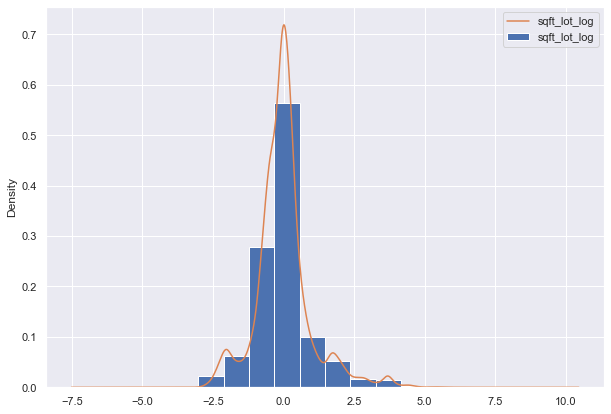

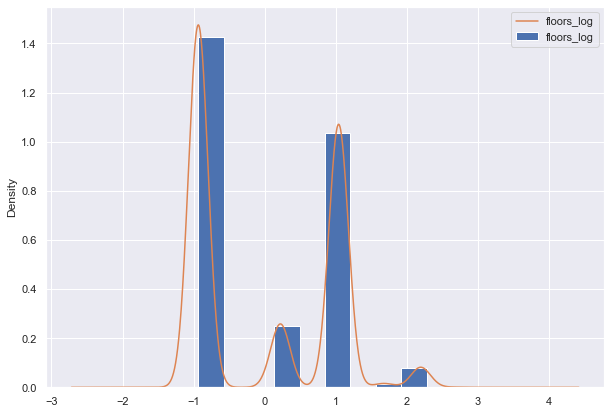

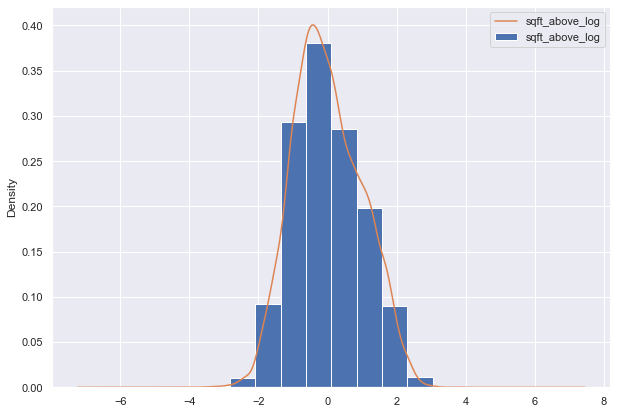

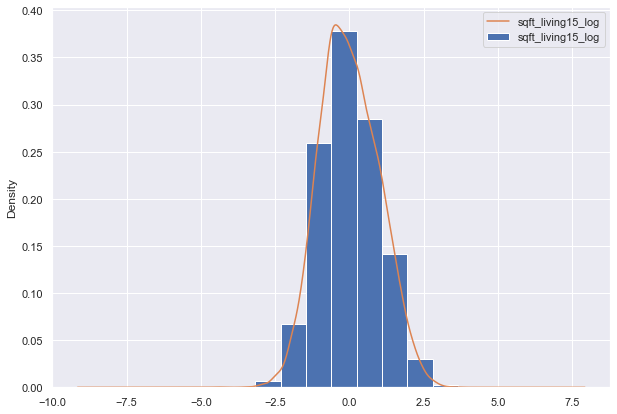

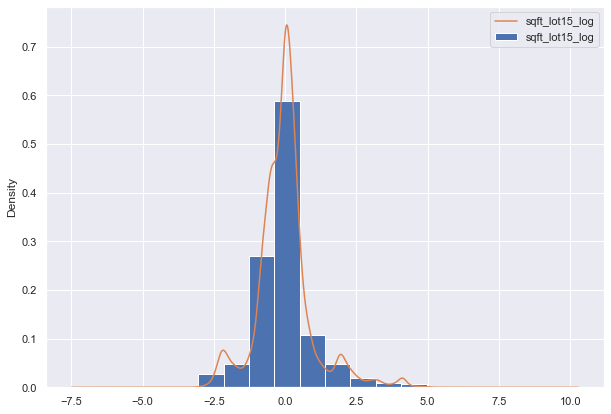

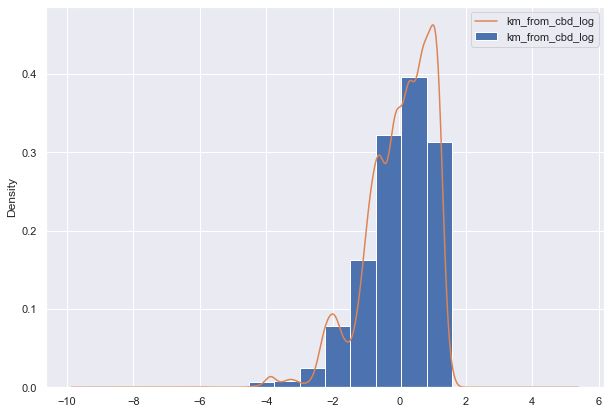

In [42]:
x = list(df_log_norm)
for column in x:
    df_log_norm[column].plot.hist(density=True)
    df_log_norm[column].plot.kde(label=column)
    plt.legend()
    plt.show()

No handles with labels found to put in legend.


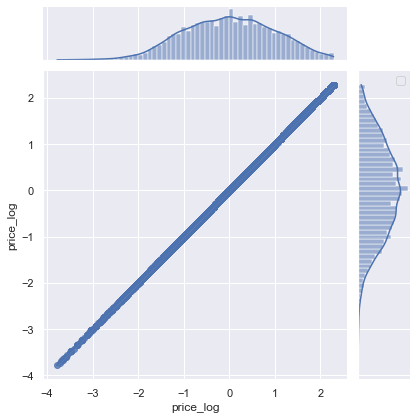

No handles with labels found to put in legend.


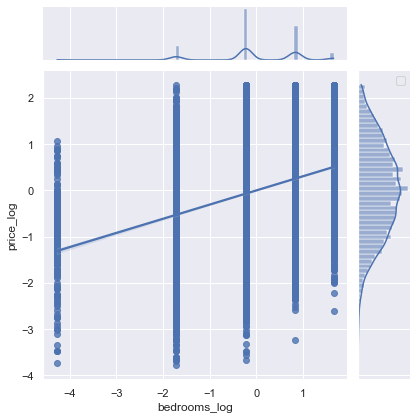

No handles with labels found to put in legend.


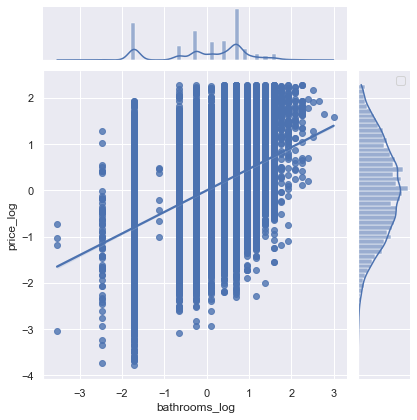

No handles with labels found to put in legend.


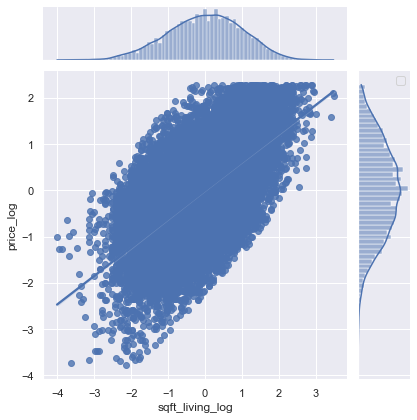

No handles with labels found to put in legend.


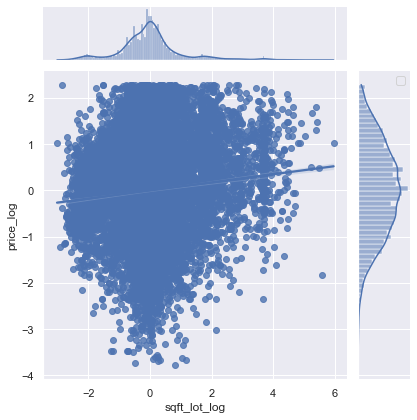

No handles with labels found to put in legend.


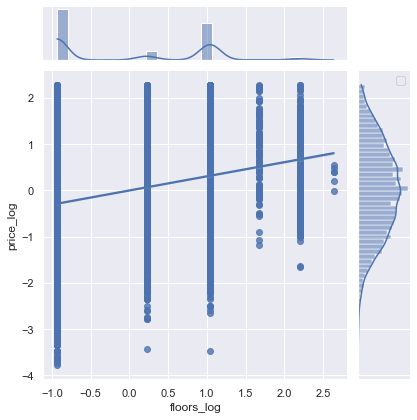

No handles with labels found to put in legend.


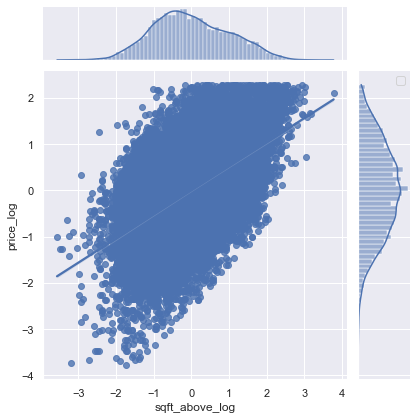

No handles with labels found to put in legend.


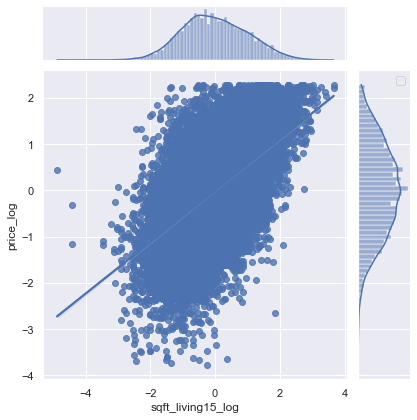

No handles with labels found to put in legend.


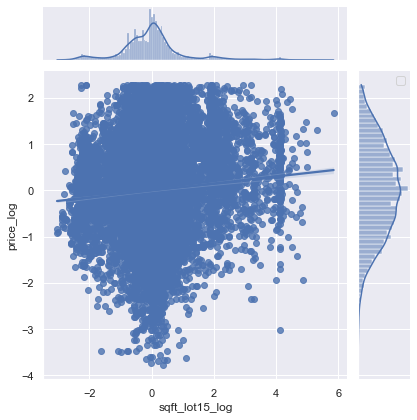

No handles with labels found to put in legend.


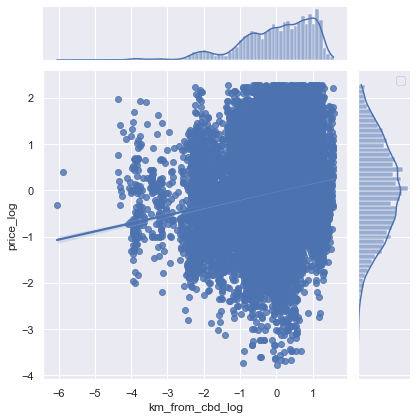

In [43]:
for column in x:
    sns.jointplot(x = column, y='price_log', data=df_log_norm, kind = 'reg', label = column)
    plt.legend()
    plt.show()

I then merged the normalized data and categorical data sets.

In [44]:
df_merged = pd.concat([df_log_norm,df_cat], axis = 1)
df_merged.head()

,price_log,bedrooms_log,bathrooms_log,sqft_living_log,sqft_lot_log,floors_log,sqft_above_log,sqft_living15_log,sqft_lot15_log,km_from_cbd_log,...,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,rating_low_grade,rating_average_grade,rating_high_grade
0,-1.487131,-0.222180,-1.709840,-1.102922,-0.362773,-0.934264,-0.711532,-1.011689,-0.372781,0.018521,...,0,0,0,1,0,0,0,0,1,0
1,0.456783,-0.222180,0.420363,0.849875,-0.086171,1.040181,0.787637,-0.270461,-0.000077,1.117658,...,0,0,0,0,0,0,0,0,1,0
2,-1.946467,-1.715423,-1.709840,-2.173860,0.273383,-0.934264,-1.762009,1.249640,0.066522,0.886634,...,0,0,0,0,0,0,0,0,1,0
3,0.710772,0.837293,1.176064,0.170098,-0.498954,-0.934264,-0.998771,-0.964367,-0.523806,0.719466,...,0,0,0,0,0,0,0,0,1,0
4,0.339467,-0.222180,0.110963,-0.216629,0.035833,-0.934264,0.157828,-0.069044,-0.022275,-0.554496,...,0,0,0,0,0,0,0,0,1,0


In [45]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 90 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price_log             20407 non-null  float64
 1   bedrooms_log          20407 non-null  float64
 2   bathrooms_log         20407 non-null  float64
 3   sqft_living_log       20407 non-null  float64
 4   sqft_lot_log          20407 non-null  float64
 5   floors_log            20407 non-null  float64
 6   sqft_above_log        20407 non-null  float64
 7   sqft_living15_log     20407 non-null  float64
 8   sqft_lot15_log        20407 non-null  float64
 9   km_from_cbd_log       20407 non-null  float64
 10  waterfront_0          20407 non-null  uint8  
 11  waterfront_1          20407 non-null  uint8  
 12  condition_1           20407 non-null  uint8  
 13  condition_2           20407 non-null  uint8  
 14  condition_3           20407 non-null  uint8  
 15  condition_4        

I then created OLS model for each of the normalized values and created a df to easily view r^, intercept, slope and P value.

In [46]:
cols = df_merged.describe().columns[1:10]

results = [['ind var','r_squared','intercept','slope','p-value']]
for idx, val in enumerate(cols):
    print('price_log~' + val)
    f = 'price_log~' +val
    model = smf.ols(formula=f, data=df_merged).fit()
    X_new = pd.DataFrame({val: [df_merged[val].min(), df_merged[val].max()]});
    pred = model.predict(X_new)
    results.append([val,model.rsquared,model.params[0], model.params[1], model.pvalues[1] ])
    print(results[idx+1])
    print(model.summary())

price_log~bedrooms_log
['bedrooms_log', 0.09403409850851585, 8.7122827398603e-15, 0.30664979782893553, 0.0]
                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     2118.
Date:                Fri, 03 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:38:52   Log-Likelihood:                -27948.
No. Observations:               20407   AIC:                         5.590e+04
Df Residuals:                   20405   BIC:                         5.592e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
---------------------

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     661.2
Date:                Fri, 03 Jun 2022   Prob (F-statistic):          1.55e-143
Time:                        14:38:52   Log-Likelihood:                -28630.
No. Observations:               20407   AIC:                         5.726e+04
Df Residuals:                   20405   BIC:                         5.728e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        9.318e-14      0.007   1.

C:\Users\shann\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


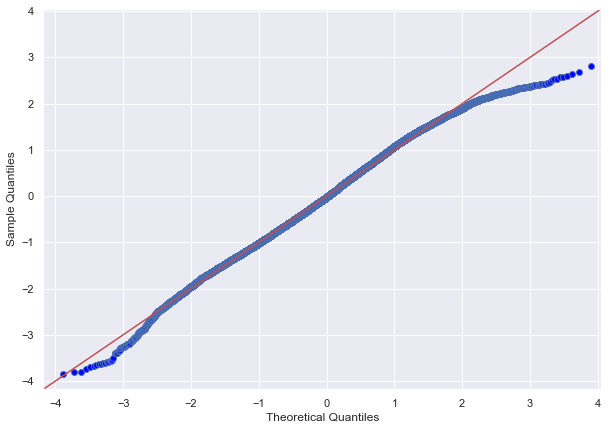

In [47]:
residuals = model.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

In [48]:
pd.DataFrame(results)

,0,1,2,3,4
0,ind var,r_squared,intercept,slope,p-value
1,bedrooms_log,0.094034,0.0,0.30665,0.0
2,bathrooms_log,0.218159,0.0,0.467075,0.0
3,sqft_living_log,0.37904,-0.0,0.615662,0.0
4,sqft_lot_log,0.007669,0.0,0.087575,0.0
5,floors_log,0.093747,0.0,0.306181,0.0
6,sqft_above_log,0.271491,-0.0,0.521048,0.0
7,sqft_living15_log,0.311769,-0.0,0.558363,0.0
8,sqft_lot15_log,0.005677,0.0,0.075347,0.0
9,km_from_cbd_log,0.031388,0.0,0.177168,0.0


I than ran the model again with all features combined.

In [49]:
f = 'price_log ~ ' + ' + '.join(cols)
model_2 = ols(formula=f, data=df_merged).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.529
Method:                 Least Squares   F-statistic:                     2547.
Date:                Fri, 03 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:38:52   Log-Likelihood:                -21270.
No. Observations:               20407   AIC:                         4.256e+04
Df Residuals:                   20397   BIC:                         4.264e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -4.878e-14      0.005  -1.02e-11      1.000      -0.009       0.009
bedrooms_log         -0.1101      0.006    -17.324      0.000      -0.123      -0.098
bathrooms_log         0.0251      0.008      3.173      0.002       0.010       0.041
sqft_living_log       0.4936      0.012     39.610      0.000       0.469       0.518
sqft_lot_log          0.0517      0.013      4.078      0.000       0.027       0.077
floors_log            0.0784      0.007     10.616      0.000       0.064       0.093
sqft_above_log       -0.0029      0.012     -0.246      0.806      -0.026       0.020
sqft_living15_log     0.2970      0.007     39.878      0.000       0.282       0.312
sqft_lot15_log       -0.0696      0.012     -5.603      0.000      -0.094      -0.045
km_from_cbd_log       0.3369      0.005     62.654      0.000       0.326       0.347
==============================================================================
Omnibus:                       96.334   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               96.377
Skew:                          -0.160   Prob(JB):                     1.18e-21
Kurtosis:                       2.893   Cond. No.                         7.30
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

C:\Users\shann\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


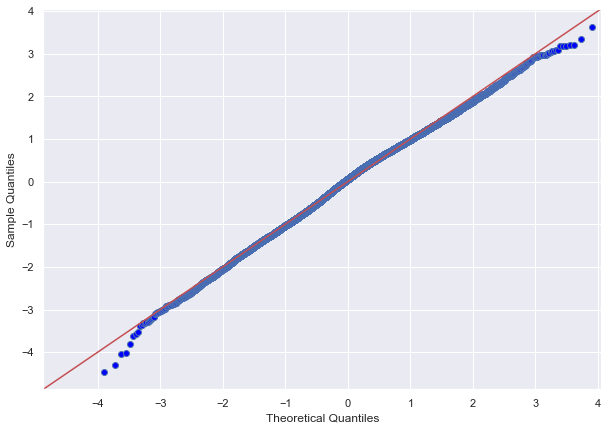

In [50]:
residuals = model_2.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

I then completed modelling all all of the categorical data.

In [51]:
c_waterfront = df_merged.columns[10:12]
c_condition = df_merged.columns[12:17]
c_zipcode = df_merged.columns[17:87]
c_grade = df_merged.columns[87:90]

In [52]:
cols = [c_waterfront, c_condition, c_grade, c_zipcode]
for col in cols:
    sum_cols = '+'.join(col)
    f = 'price_log ~' + sum_cols
    model = smf.ols(formula=f, data=df_merged).fit()
    print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              price_log   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     33.11
Date:                Fri, 03 Jun 2022   Prob (F-statistic):           4.42e-15
Time:                        14:38:53   Log-Likelihood:                -28923.
No. Observations:               20407   AIC:                         5.785e+04
Df Residuals:                   20404   BIC:                         5.788e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        0.3481      0.043      8.089   

C:\Users\shann\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


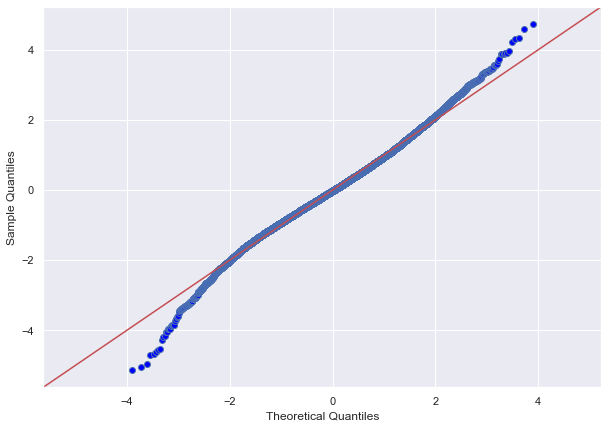

In [53]:
residuals = model.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

After assessing the first model I droped fields with low r^ values.

In [54]:
df_model = df_merged.drop(['bedrooms_log','sqft_lot_log','sqft_above_log', 'sqft_lot15_log','floors_log'], axis=1)

In [55]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 85 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price_log             20407 non-null  float64
 1   bathrooms_log         20407 non-null  float64
 2   sqft_living_log       20407 non-null  float64
 3   sqft_living15_log     20407 non-null  float64
 4   km_from_cbd_log       20407 non-null  float64
 5   waterfront_0          20407 non-null  uint8  
 6   waterfront_1          20407 non-null  uint8  
 7   condition_1           20407 non-null  uint8  
 8   condition_2           20407 non-null  uint8  
 9   condition_3           20407 non-null  uint8  
 10  condition_4           20407 non-null  uint8  
 11  condition_5           20407 non-null  uint8  
 12  zipcode_98001         20407 non-null  uint8  
 13  zipcode_98002         20407 non-null  uint8  
 14  zipcode_98003         20407 non-null  uint8  
 15  zipcode_98004      

I then did the same with categorical values.

In [56]:
df_model = df_model.drop(df_model.columns[7:82], axis=1)

In [57]:
df_model.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20407 entries, 0 to 21596
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price_log             20407 non-null  float64
 1   bathrooms_log         20407 non-null  float64
 2   sqft_living_log       20407 non-null  float64
 3   sqft_living15_log     20407 non-null  float64
 4   km_from_cbd_log       20407 non-null  float64
 5   waterfront_0          20407 non-null  uint8  
 6   waterfront_1          20407 non-null  uint8  
 7   rating_low_grade      20407 non-null  uint8  
 8   rating_average_grade  20407 non-null  uint8  
 9   rating_high_grade     20407 non-null  uint8  
dtypes: float64(5), uint8(5)
memory usage: 1.0 MB


In [58]:
df_model.isnull().sum()

price_log               0
bathrooms_log           0
sqft_living_log         0
sqft_living15_log       0
km_from_cbd_log         0
waterfront_0            0
waterfront_1            0
rating_low_grade        0
rating_average_grade    0
rating_high_grade       0
dtype: int64

In [59]:
model = df_model.drop(['price_log'],axis=1)
f = 'price_log ~ bathrooms_log+sqft_living_log+sqft_living15_log+km_from_cbd_log+waterfront_1+rating_low_grade+rating_average_grade+rating_high_grade'
model = smf.ols(formula=f, data=df_model).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.527
Model:                            OLS   Adj. R-squared:                  0.527
Method:                 Least Squares   F-statistic:                     3244.
Date:                Fri, 03 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:38:54   Log-Likelihood:                -21322.
No. Observations:               20407   AIC:                         4.266e+04
Df Residuals:                   20399   BIC:                         4.272e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.0273      0.012      2.268      0.023       0.004       0.051
bathrooms_log            0.0632      0.007      8.810      0.000       0.049       0.077
sqft_living_log          0.3877      0.009     43.476      0.000       0.370       0.405
sqft_living15_log        0.2796      0.007     38.529      0.000       0.265       0.294
km_from_cbd_log          0.3396      0.005     67.982      0.000       0.330       0.349
waterfront_1             0.8624      0.089      9.685      0.000       0.688       1.037
rating_low_grade        -0.3423      0.034    -10.215      0.000      -0.408      -0.277
rating_average_grade    -0.0493      0.013     -3.929      0.000      -0.074      -0.025
rating_high_grade        0.4189      0.021     19.581      0.000       0.377       0.461
==============================================================================
Omnibus:                       92.698   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               90.193
Skew:                          -0.144   Prob(JB):                     2.60e-20
Kurtosis:                       2.848   Cond. No.                     7.34e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 9.3e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

C:\Users\shann\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


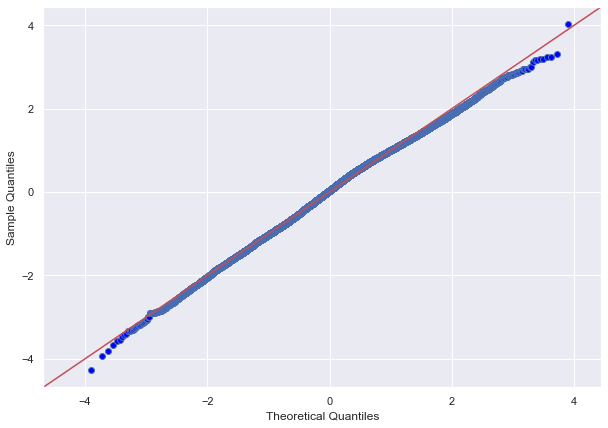

In [60]:
residuals = model.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

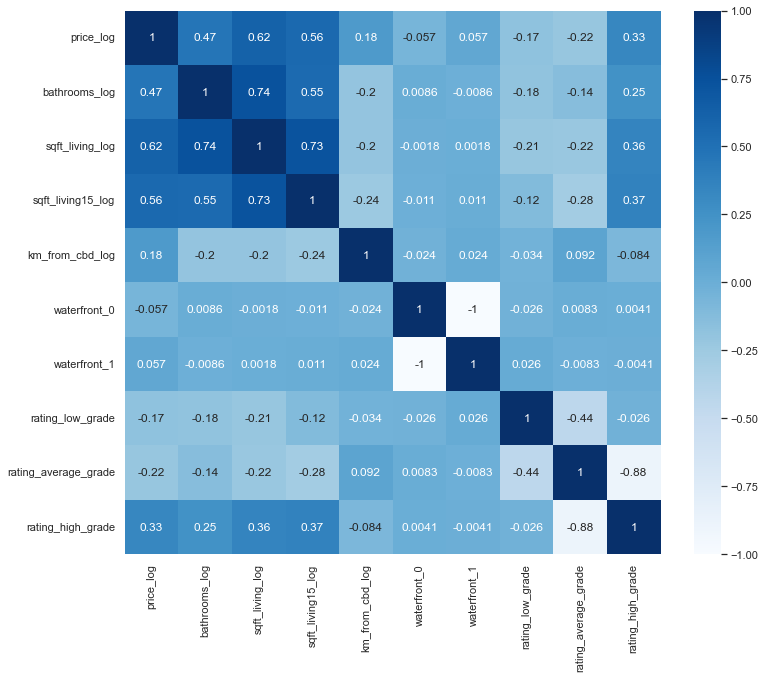

In [61]:
corr = df_model.corr()
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, cmap="Blues", annot=True);

In [62]:
df_model.isnull().sum()

price_log               0
bathrooms_log           0
sqft_living_log         0
sqft_living15_log       0
km_from_cbd_log         0
waterfront_0            0
waterfront_1            0
rating_low_grade        0
rating_average_grade    0
rating_high_grade       0
dtype: int64

In [63]:
df_model_final = df_model[['price_log','bathrooms_log','sqft_living_log','sqft_living15_log','km_from_cbd_log','rating_high_grade']]

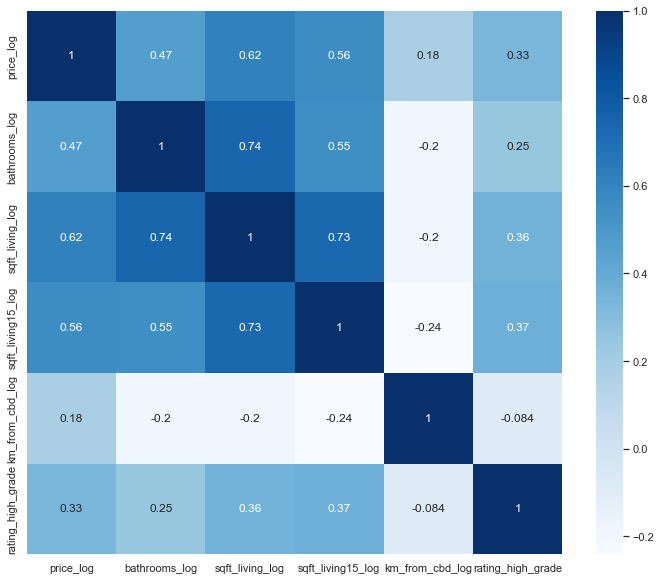

In [64]:
corr = df_model_final.corr()
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corr, cmap="Blues", annot=True);

In [65]:
model2 = df_model_final.drop(['price_log'],axis=1)
f = 'price_log ~ bathrooms_log+sqft_living_log+sqft_living15_log+rating_high_grade'
model2 = smf.ols(formula=f, data=df_model_final).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.413
Method:                 Least Squares   F-statistic:                     3592.
Date:                Fri, 03 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:38:55   Log-Likelihood:                -23516.
No. Observations:               20407   AIC:                         4.704e+04
Df Residuals:                   20402   BIC:                         4.708e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.0235      0.006     -4.259      0.000      -0.034      -0.013
bathrooms_log         0.0280      0.008      3.521      0.000       0.012       0.044
sqft_living_log       0.4062      0.010     41.272      0.000       0.387       0.425
sqft_living15_log     0.2075      0.008     25.980      0.000       0.192       0.223
rating_high_grade     0.4723      0.027     17.611      0.000       0.420       0.525
==============================================================================
Omnibus:                      305.924   Durbin-Watson:                   1.969
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              187.564
Skew:                          -0.072   Prob(JB):                     1.87e-41
Kurtosis:                       2.553   Cond. No.                         7.71
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

C:\Users\shann\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


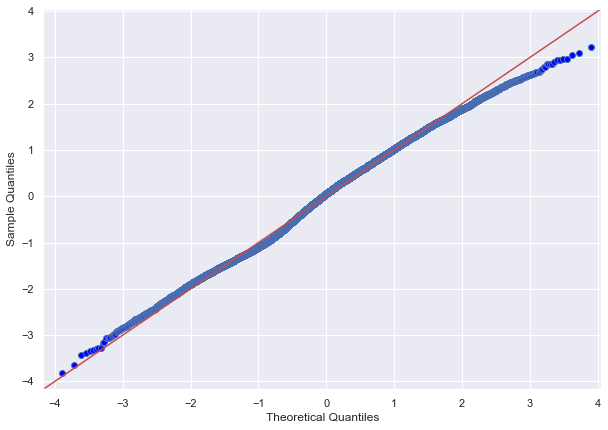

In [66]:
residuals = model2.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

In [67]:
def stepwise_selection(X, y, 
                       initial_list=[], 
                       threshold_in=0.01, 
                       threshold_out = 0.05, 
                       verbose=True):
    """ 
    Perform a forward-backward feature selection 
    based on p-value from statsmodels.api.OLS
    Arguments:
        X - pandas.DataFrame with candidate features
        y - list-like with the target
        initial_list - list of features to start with (column names of X)
        threshold_in - include a feature if its p-value < threshold_in
        threshold_out - exclude a feature if its p-value > threshold_out
        verbose - whether to print the sequence of inclusions and exclusions
    Returns: list of selected features 
    Always set threshold_in < threshold_out to avoid infinite looping.
    See https://en.wikipedia.org/wiki/Stepwise_regression for the details
    """
    included = list(initial_list)
    while True:
        changed=False
        # forward step
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded, dtype='float64')
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

        # backward step
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

In [68]:
y = df_model_final[['price_log']]
X = df_model_final.drop(['price_log'],axis=1)
X.head()

,bathrooms_log,sqft_living_log,sqft_living15_log,km_from_cbd_log,rating_high_grade
0,-1.709840,-1.102922,-1.011689,0.018521,0
1,0.420363,0.849875,-0.270461,1.117658,0
2,-1.709840,-2.173860,1.249640,0.886634,0
3,1.176064,0.170098,-0.964367,0.719466,0
4,0.110963,-0.216629,-0.069044,-0.554496,0


In [69]:
import warnings
warnings.filterwarnings('ignore')

result = stepwise_selection(X, y, verbose = True)
print('resulting features:')
print(result)

Add  sqft_living15_log              with p-value 0.0
Add  sqft_living_log                with p-value 0.0
Add  km_from_cbd_log                with p-value 0.0
Add  rating_high_grade              with p-value 3.64675e-77
Add  bathrooms_log                  with p-value 3.13284e-19
resulting features:
['sqft_living15_log', 'sqft_living_log', 'km_from_cbd_log', 'rating_high_grade', 'bathrooms_log']


In [70]:
X_fin = X[result]
X_with_intercept = sm.add_constant(X_fin)
model_2 = sm.OLS(y,X_with_intercept).fit()
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.524
Model:                            OLS   Adj. R-squared:                  0.524
Method:                 Least Squares   F-statistic:                     4485.
Date:                Fri, 03 Jun 2022   Prob (F-statistic):               0.00
Time:                        14:38:56   Log-Likelihood:                -21390.
No. Observations:               20407   AIC:                         4.279e+04
Df Residuals:                   20401   BIC:                         4.284e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0229      0.005     -4.593      0.000      -0.033      -0.013
sqft_living15_log     0.2791      0.007     38.373      0.000       0.265       0.293
sqft_living_log       0.3956      0.009     44.604      0.000       0.378       0.413
km_from_cbd_log       0.3434      0.005     68.749      0.000       0.334       0.353
rating_high_grade     0.4590      0.024     18.991      0.000       0.412       0.506
bathrooms_log         0.0645      0.007      8.973      0.000       0.050       0.079
==============================================================================
Omnibus:                       92.684   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               91.160
Skew:                          -0.149   Prob(JB):                     1.60e-20
Kurtosis:                       2.863   Cond. No.                         7.86
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

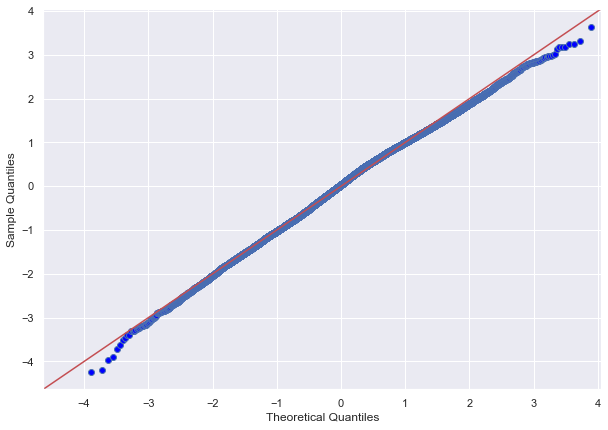

In [71]:
residuals = model_2.resid
sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
plt.show()

In [72]:
linreg = LinearRegression()
selector = RFE(linreg, n_features_to_select = 5)
selector = selector.fit(X, y.values.ravel()) # convert y to 1d np array to prevent DataConversionWarning
selector.support_

array([ True,  True,  True,  True,  True])

In [73]:
selected_columns = X.columns[selector.support_ ]
linreg.fit(X[selected_columns],y)

LinearRegression()

In [74]:
yhat = linreg.predict(X[selected_columns])

In [75]:
SS_Residual = np.sum((y-yhat)**2)
SS_Total = np.sum((y-np.mean(y))**2)
r_squared = 1 - (float(SS_Residual))/SS_Total
adjusted_r_squared = 1 - (1-r_squared)*(len(y)-1)/(len(y)-X[selected_columns].shape[1]-1)

In [76]:
r_squared

price_log    0.523618
dtype: float64

In [77]:
adjusted_r_squared

price_log    0.523501
dtype: float64

In [78]:
y = df_model_final[['price_log']]
X = df_model_final.drop(['price_log'],axis=1)

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [80]:
print(len(X_train), len(X_test), len(y_train), len(y_test))

15305 5102 15305 5102


In [81]:
linreg.fit(X_train, y_train)
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

LinearRegression()

In [82]:
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

In [83]:
train_residuals = y_hat_train - y_train
test_residuals = y_hat_test - y_test
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error:', train_mse)
print('Test Mean Squarred Error:', test_mse)

Train Mean Squarred Error: 0.47567906465552745
Test Mean Squarred Error: 0.478444767490055


In [84]:
def kfolds(data, k):
    # Force data as pandas DataFrame
    data = pd.DataFrame(df_model)
    num_observations = len(df_model)
    fold_size = num_observations//k
    leftovers = num_observations%k
    folds = []
    start_obs = 0
    for fold_n in range(1,k+1):
        if fold_n <= leftovers:
            #Fold Size will be 1 larger to account for leftovers
            fold =  data.iloc[start_obs : start_obs+fold_size+1] 
            folds.append(fold)
            start_obs +=  fold_size + 1
        else:
            fold =  data.iloc[start_obs : start_obs+fold_size] 
            folds.append(fold)
            start_obs +=  fold_size
            
    return folds 

In [85]:
df_model_final = pd.concat([X.reset_index(drop=True), y], axis=1)

In [86]:
df_folds = kfolds(df_model_final, 5)

In [87]:
test_errs = []
train_errs = []
k=5

for n in range(k):
    # Split in train and test for the fold
    train = pd.concat([fold for i, fold in enumerate(df_folds) if i!=n])
    test = df_folds[n]
    # Fit a linear regression model
    linreg.fit(X_train, y_train)
    #Evaluate Train and Test Errors
    y_hat_train = linreg.predict(X_train)
    y_hat_test = linreg.predict(X_test)
    train_residuals = y_hat_train - y_train
    test_residuals = y_hat_test - y_test
    train_errs.append(np.mean(train_residuals.astype(float)**2))
    test_errs.append(np.mean(test_residuals.astype(float)**2))
print(train_errs)
print(test_errs)

[price_log    0.475679
dtype: float64, price_log    0.475679
dtype: float64, price_log    0.475679
dtype: float64, price_log    0.475679
dtype: float64, price_log    0.475679
dtype: float64]
[price_log    0.478445
dtype: float64, price_log    0.478445
dtype: float64, price_log    0.478445
dtype: float64, price_log    0.478445
dtype: float64, price_log    0.478445
dtype: float64]


In [88]:
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import cross_val_score

mse = make_scorer(mean_squared_error)

cv_5_results = cross_val_score(linreg, X, y, cv=5, scoring=mse)

In [89]:
cv_5_results.mean()

0.47745926629399066

In [90]:
regression = LinearRegression()

In [91]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

crossvalidation = KFold(n_splits=5, shuffle=True, random_state=1)
baseline = np.mean(cross_val_score(regression, X, y, scoring='r2', cv=crossvalidation))

baseline

0.5234626715725688

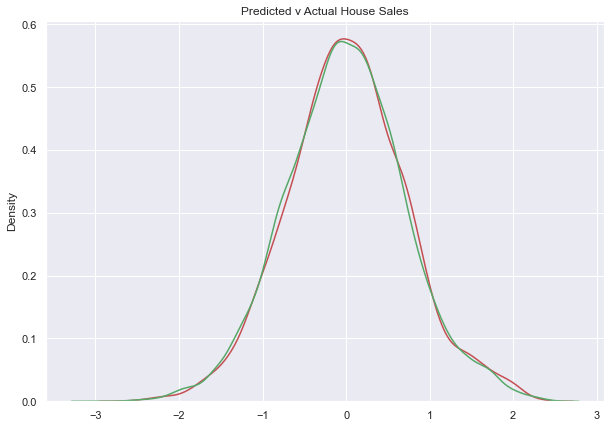

In [92]:
plt.title("Predicted v Actual House Sales")
ax1=sns.distplot(y_hat_test, color='r', hist=False)
sns.distplot(y_hat_train, color='g', hist=False, ax=ax1)
sns.set(rc = {'figure.figsize':(15,12)})
plt.show()